In [ ]:
import datacube
import matplotlib.pyplot as plt

product_name = 'bh_aerial_image_1999'

query = {
    'latitude': ( -19.91, -19.93),
    'longitude': ( -43.95, -43.96),
}

dc = datacube.Datacube()
dc.index.products.get_by_name(product_name)


product_info = dc.index.products.get_by_name(product_name)


resolution = product_info.definition['storage']['resolution']
crs = product_info.definition['storage']['crs']


dc = datacube.Datacube()
dc.index.products.get_by_name(product_name)


ds = dc.load(product=product_name, output_crs=crs, resolution=(resolution['x'],resolution['y']), **query)

print(ds)

In [35]:
dd_cfg = {
    "components": {
        "red": {"band_1": 1.0},
        "green": {"band_1": 1.0},
        "blue": {"band_1": 1.0},
    },
    "scale_range": (1, 255),
}

In [36]:
from datacube_ows.styles.api import StandaloneStyle, apply_ows_style_cfg, xarray_image_as_png

xr_image = apply_ows_style_cfg(dd_cfg, ds)
png_image = xarray_image_as_png(xr_image)
with open("example1.png", "wb") as fp:
     fp.write(png_image)

In [37]:
print(type(png_image))

<class 'bytes'>


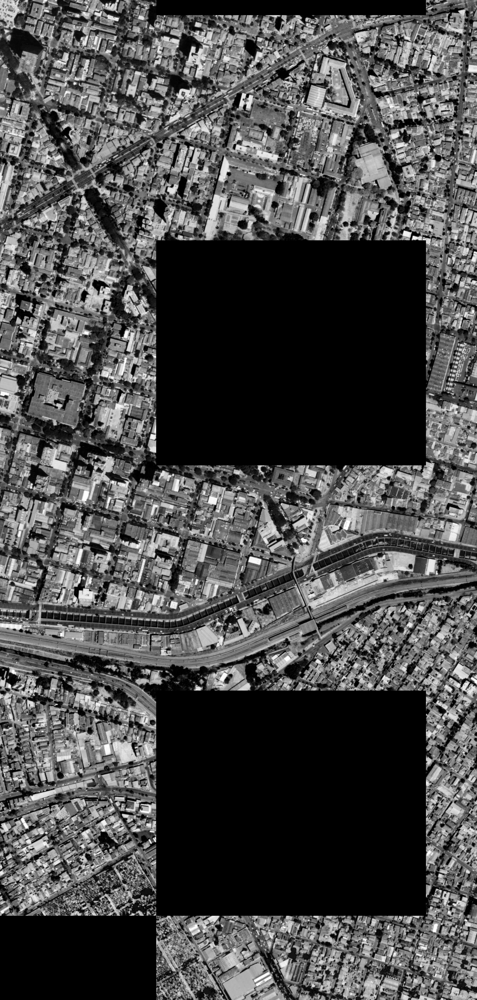

In [38]:
from IPython.display import display, Image
from io import BytesIO

# Ensure png_image is a bytes object
if isinstance(png_image, BytesIO):
    # If png_image is a BytesIO object, get the bytes data from it
    png_image_bytes = png_image.getvalue()
else:
    # If it's already a bytes object, use it directly
    png_image_bytes = png_image

# Display the image
display(Image(png_image_bytes))
